# **Abstract**

This dataset represents a synthetic collection of data generated to simulate house prices in an urban context, specifically modeled after the imaginary real estate market in Paris. It serves as a fictional yet structured representation of housing-related information, offering insights into various attributes such as square meters, number of rooms, yard and pool presence, and other features associated with residential properties. While the data is not derived from actual observations, it provides a valuable and controlled environment for testing and understanding statistical methods and machine learning models applied to housing datasets.

# **Dataset**


The above dataset has 18 columns with 17 numerical and 1 categorical columns.

It consists of following columns

i) squareMeters: Total square meters of the house.

ii) numberOfRooms: Number of rooms in the house.

iii) hasYard: Binary indicator (1 or 0) for whether the house has a yard.

iv) hasPool: Binary indicator (1 or 0) for whether the house has a pool.

v) floors: Number of floors in the house.

vi) cityCode: Zip code of the house location.

vii) cityPartRange: Range indicating the exclusivity of the neighborhood (higher range, more exclusive).

viii) numPrevOwners: Number of previous owners of the house.

ix) made: Year the house was built.

x) isNewBuilt: Binary indicator (1 or 0) for whether the house is newly built.

xi) hasStormProtector: Binary indicator (1 or 0) for whether the house has a storm protector.

xii) basement: Square meters of the basement in the house.

xiii) attic: Square meters of the attic in the house.

xiv) garage: Size of the garage.

xv) hasStorageRoom: Binary indicator (1 or 0) for whether the house has a storage room.

xvi) hasGuestRoom: Number of guest rooms in the house.

xvii) price: Price of the house.

xviii) category: Categorization of the house as "Luxury" or "Basic."

In [1]:
!pip install h2o

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.2/265.2 MB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.44.0.3-py2.py3-none-any.whl size=265293968 sha256=ea410b8062706ead272193449fa16fa888949c2ef642dbdae6faa71ec0bb27b2
  Stored in directory: /root/.cache/pip/wheels/77/9a/1c/2da26f943fd46b57f3c20b54847b936b9152b831dc7447cf71
Successfully built h2o


In [92]:
import h2o
import pandas as pd
from h2o.automl import H2OAutoML

import seaborn as sns
import matplotlib.pyplot as plt

import numpy as np

import statsmodels.api as sm
from statsmodels.api import OLS
import statsmodels.formula.api as smf
from statsmodels.stats.stattools import durbin_watson

from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split as tts

import pylab

import scipy.stats as stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

from h2o.estimators.glm import H2OGeneralizedLinearEstimator

In [70]:
mse_dict = dict()

In [3]:
max_run_time = 200

In [4]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.21" 2023-10-17; OpenJDK Runtime Environment (build 11.0.21+9-post-Ubuntu-0ubuntu122.04); OpenJDK 64-Bit Server VM (build 11.0.21+9-post-Ubuntu-0ubuntu122.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpq87xve89
  JVM stdout: /tmp/tmpq87xve89/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpq87xve89/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,06 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.3
H2O_cluster_version_age:,1 month and 30 days
H2O_cluster_name:,H2O_from_python_unknownUser_nwoknt
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.170 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [5]:
dff = pd.read_csv('https://raw.githubusercontent.com/RMNaveen/INFO-6105/main/ParisHousingClass99.88.csv')

In [6]:
label_encoder = LabelEncoder()
dff['category'] = label_encoder.fit_transform(dff['category'])

In [7]:
df = h2o.H2OFrame(dff)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [8]:
dff.head()

,squareMeters,numberOfRooms,hasYard,hasPool,floors,cityCode,cityPartRange,numPrevOwners,made,isNewBuilt,hasStormProtector,basement,attic,garage,hasStorageRoom,hasGuestRoom,price,category
0,75523,3,0,1,63,9373,3,8,2005,0,1,4313,9005,956,0,7,7559081.5,0
1,80771,39,1,1,98,39381,8,6,2015,1,0,3653,2436,128,1,2,8085989.5,1
2,55712,58,0,1,19,34457,6,8,2021,0,0,2937,8852,135,1,9,5574642.1,0
3,32316,47,0,0,6,27939,10,4,2012,0,1,659,7141,359,0,3,3232561.2,1
4,70429,19,1,1,90,38045,3,7,1990,1,0,8435,2429,292,1,4,7055052.0,1


In [9]:
dff.describe()

,squareMeters,numberOfRooms,hasYard,hasPool,floors,cityCode,cityPartRange,numPrevOwners,made,isNewBuilt,hasStormProtector,basement,attic,garage,hasStorageRoom,hasGuestRoom,price,category
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.00000,10000.00000,10000.000000,10000.00000,1.000000e+04,10000.000000
mean,49870.13120,50.358400,0.508700,0.496800,50.276300,50225.486100,5.510100,5.521700,2005.48850,0.499100,0.499900,5033.103900,5028.01060,553.12120,0.503000,4.99460,4.993448e+06,0.253000
std,28774.37535,28.816696,0.499949,0.500015,28.889171,29006.675799,2.872024,2.856667,9.30809,0.500024,0.500025,2876.729545,2894.33221,262.05017,0.500016,3.17641,2.877424e+06,0.434753
min,89.00000,1.000000,0.000000,0.000000,1.000000,3.000000,1.000000,1.000000,1990.00000,0.000000,0.000000,0.000000,1.00000,100.00000,0.000000,0.00000,1.031350e+04,0.000000
25%,25098.50000,25.000000,0.000000,0.000000,25.000000,24693.750000,3.000000,3.000000,1997.00000,0.000000,0.000000,2559.750000,2512.00000,327.75000,0.000000,2.00000,2.516402e+06,0.000000
50%,50105.50000,50.000000,1.000000,0.000000,50.000000,50693.000000,5.000000,5.000000,2005.50000,0.000000,0.000000,5092.500000,5045.00000,554.00000,1.000000,5.00000,5.016180e+06,0.000000
75%,74609.75000,75.000000,1.000000,1.000000,76.000000,75683.250000,8.000000,8.000000,2014.00000,1.000000,1.000000,7511.250000,7540.50000,777.25000,1.000000,8.00000,7.469092e+06,1.000000
max,99999.00000,100.000000,1.000000,1.000000,100.000000,99953.000000,10.000000,10.000000,2021.00000,1.000000,1.000000,10000.000000,10000.00000,1000.00000,1.000000,10.00000,1.000677e+07,1.000000


In [10]:
df.types

{'squareMeters': 'int',
 'numberOfRooms': 'int',
 'hasYard': 'int',
 'hasPool': 'int',
 'floors': 'int',
 'cityCode': 'int',
 'cityPartRange': 'int',
 'numPrevOwners': 'int',
 'made': 'int',
 'isNewBuilt': 'int',
 'hasStormProtector': 'int',
 'basement': 'int',
 'attic': 'int',
 'garage': 'int',
 'hasStorageRoom': 'int',
 'hasGuestRoom': 'int',
 'price': 'real',
 'category': 'int'}

In [11]:
df.shape

(10000, 18)

In [12]:
train_df, test_df = df.split_frame([0.75])

In [13]:
train_df.shape, test_df.shape

((7516, 18), (2484, 18))

In [14]:
X = df.columns
y = 'price'
X.remove(y)
X

['squareMeters',
 'numberOfRooms',
 'hasYard',
 'hasPool',
 'floors',
 'cityCode',
 'cityPartRange',
 'numPrevOwners',
 'made',
 'isNewBuilt',
 'hasStormProtector',
 'basement',
 'attic',
 'garage',
 'hasStorageRoom',
 'hasGuestRoom',
 'category']

In [15]:
aml = H2OAutoML(max_runtime_secs=max_run_time, seed=1)

In [87]:
aml.train(x=X,y=y,training_frame=train_df, validation_frame=test_df)

AutoML progress: |
22:58:39.628: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.
22:58:39.630: New models will be added to existing leaderboard AutoML_2_20240219_194916@@price (leaderboard frame=null) with already 19 models.

██████████████████████████████████████████████████
23:01:20.550: StackedEnsemble_AllModels_3_AutoML_3_20240219_225839 [StackedEnsemble all_2 (built with AUTO metalearner, using all AutoML models)] failed: water.exceptions.H2OIllegalArgumentException: Base models are inconsistent: they use different size (number of rows) training frames. Found: 7516 (StackedEnsemble) and 7460 (model GBM_2_AutoML_2_20240219_194916).

████████
23:01:45.328: StackedEnsemble_BestOfFamily_4_AutoML_3_20240219_225839 [StackedEnsemble best_of_family_3 (built with AUTO metalearner, us

key,value
Stacking strategy,cross_validation
Number of base models (used / total),6/12
# GBM base models (used / total),3/5
# XGBoost base models (used / total),2/3
# DeepLearning base models (used / total),1/1
# DRF base models (used / total),0/2
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


In [17]:
print(aml.leaderboard)

model_id                                                     rmse          mse      mae      rmsle    mean_residual_deviance
StackedEnsemble_AllModels_2_AutoML_1_20240219_194542      44708.3  1.99883e+09  33854.8  nan                     1.99883e+09
StackedEnsemble_BestOfFamily_3_AutoML_1_20240219_194542   44816.3  2.0085e+09   33973.9  nan                     2.0085e+09
StackedEnsemble_AllModels_1_AutoML_1_20240219_194542      45866.1  2.1037e+09   34764.3  nan                     2.1037e+09
StackedEnsemble_BestOfFamily_2_AutoML_1_20240219_194542   51755.5  2.67863e+09  39054.4  nan                     2.67863e+09
GBM_3_AutoML_1_20240219_194542                            60865.4  3.7046e+09   46536.9    0.12345               3.7046e+09
StackedEnsemble_BestOfFamily_1_AutoML_1_20240219_194542   66776.4  4.45908e+09  51261.9  nan                     4.45908e+09
XGBoost_3_AutoML_1_20240219_194542                        68309    4.66612e+09  47605.2  nan                     4.66612e+09
GBM

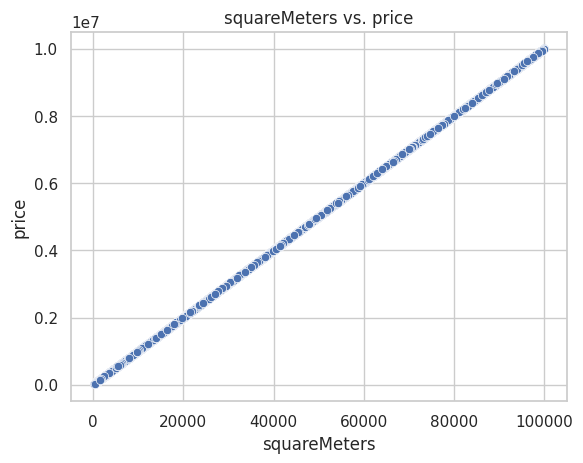

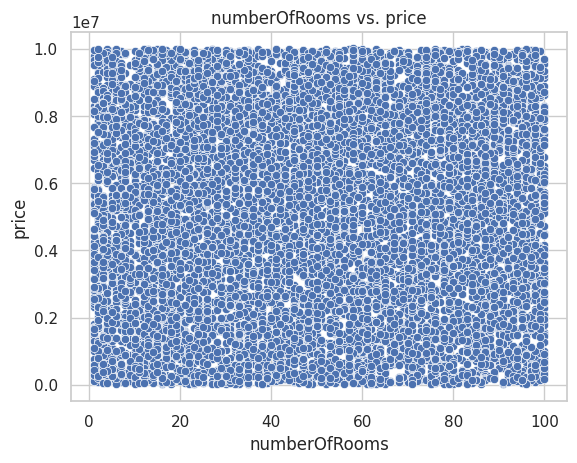

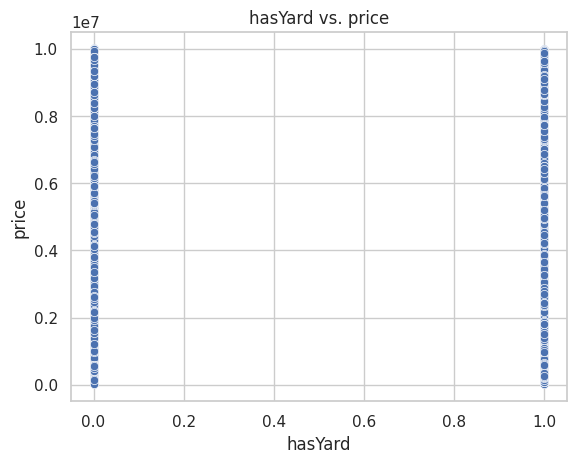

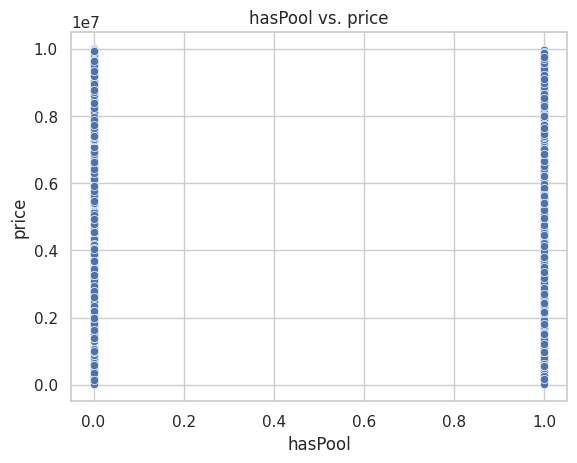

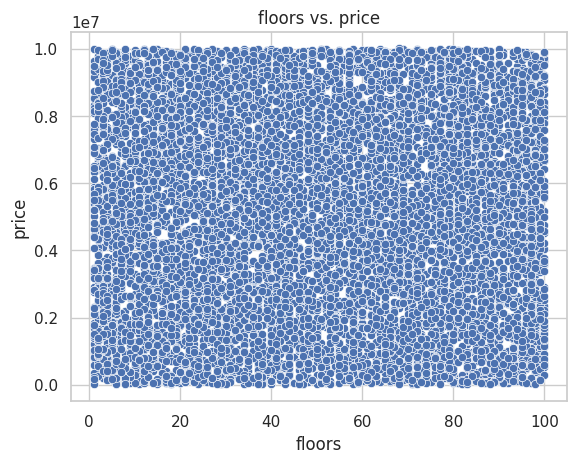

...

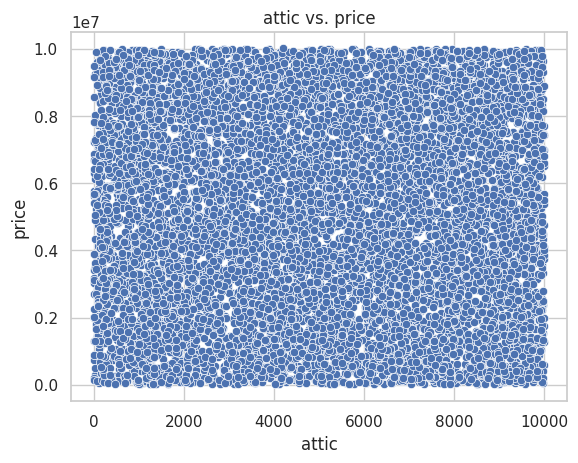

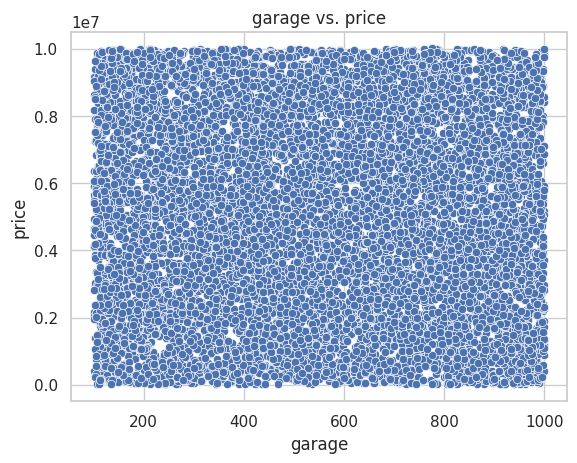

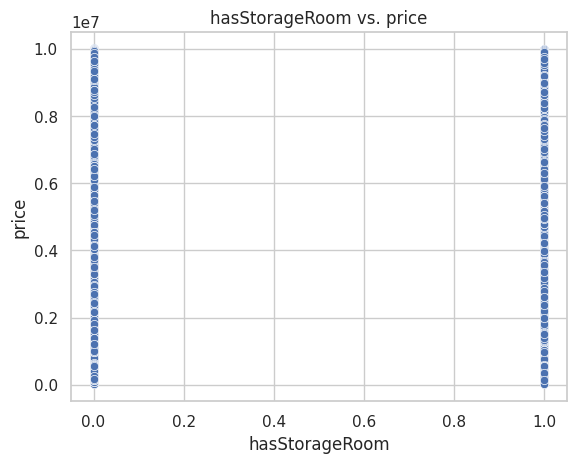

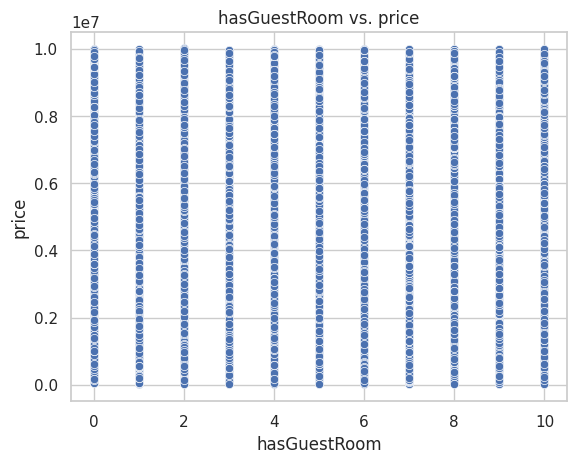

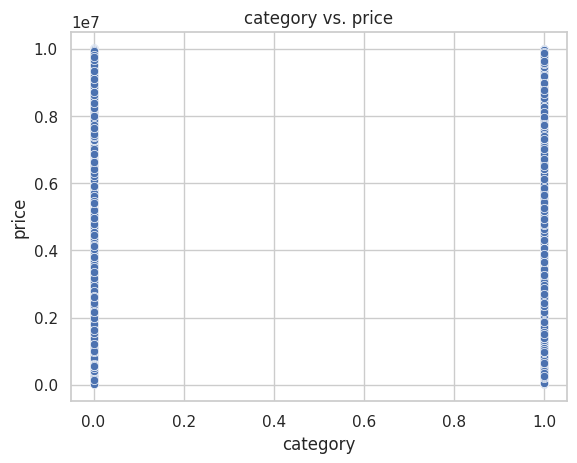

In [18]:
sns.set(style="whitegrid")

for item in X:
  sns.scatterplot(x=item, y=y, data=dff)

  plt.xlabel(item)
  plt.ylabel(y)
  plt.title(f'{item} vs. {y}')

  plt.show()

# **Multi Collinearity Check using VIF**

In [19]:
X_df = dff.drop(y, axis=1)
y_df = dff[y]

vif_data = pd.DataFrame()
vif_data["variable"] = X_df.columns
vif_data["VIF"] = [variance_inflation_factor(X_df.values, i) for i in range(X_df.shape[1])]

print(vif_data)

             variable        VIF
0        squareMeters   4.008217
1       numberOfRooms   4.064674
2             hasYard   4.026328
3             hasPool   1.989576
4              floors   4.034625
5            cityCode   4.000583
6       cityPartRange   4.687629
7       numPrevOwners   4.748647
8                made  38.814462
9          isNewBuilt   4.035484
10  hasStormProtector   2.000742
11           basement   4.066504
12              attic   4.025164
13             garage   5.471257
14     hasStorageRoom   2.017455
15       hasGuestRoom   3.480864
16           category   3.992731


**General Interpretation of the VIF values:**

VIF around 1: No multicollinearity.


VIF between 1 and 5: Moderate multicollinearity (usually acceptable).


VIF above 5: High multicollinearity (may need attention).


Variables with VIF around 4 (e.g., squareMeters, numberOfRooms, hasYard, floors, cityCode, isNewBuilt, basement, attic, hasGuestRoom, category) generally have moderate multicollinearity, which is usually acceptable.

The variable 'made' has a very high VIF of 38.814462, indicating a potential issue with multicollinearity. High VIF suggests that 'made' may be highly correlated with other predictors in our model. But looking at the correlation_matrix, it is evident that 'made' has no significant correlation with the predictor or other dependant variables.

In [94]:
results = smf.ols('price ~ squareMeters + numberOfRooms + hasYard + hasPool + floors + cityCode + cityPartRange + numPrevOwners + made + isNewBuilt + hasStormProtector + basement + attic + garage + hasStorageRoom + hasGuestRoom + category', dff).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.351e+09
Date:                Tue, 20 Feb 2024   Prob (F-statistic):               0.00
Time:                        00:00:08   Log-Likelihood:                -89669.
No. Observations:               10000   AIC:                         1.794e+05
Df Residuals:                    9982   BIC:                         1.795e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept          4900.1767   4093.263      1.197      0.231   -3123.443    1.29e+04
squareMeters        100.0000      0.001   1.51e+05      0.000      99.999     100.001
numberOfRooms         0.2507      0.660      0.380      0.704      -1.042       1.544
hasYard            3025.7252     53.418     56.643      0.000    2921.016    3130.435
hasPool            2977.0672     37.993     78.358      0.000    2902.593    3051.541
floors               54.5450      0.658     82.937      0.000      53.256      55.834
cityCode             -0.0008      0.001     -1.227      0.220      -0.002       0.000
cityPartRange        47.3236      6.615      7.154      0.000      34.356      60.291
numPrevOwners        -0.3931      6.655     -0.059      0.953     -13.438      12.652
made                 -2.3028      2.041     -1.128      0.259      -6.303       1.697
isNewBuilt          171.7592     53.993      3.181      0.001      65.923     277.595
hasStormProtector   140.9886     37.982      3.712      0.000      66.537     215.440
basement             -0.0021      0.007     -0.324      0.746      -0.015       0.011
attic                -0.0046      0.007     -0.696      0.487      -0.017       0.008
garage                0.1132      0.073      1.561      0.119      -0.029       0.255
hasStorageRoom       19.5218     38.025      0.513      0.608     -55.014      94.058
hasGuestRoom         -5.6450      5.985     -0.943      0.346     -17.376       6.086
category            -26.9786     75.433     -0.358      0.721    -174.842     120.885
==============================================================================
Omnibus:                       11.948   Durbin-Watson:                   2.038
Prob(Omnibus):                  0.003   Jarque-Bera (JB):               13.794
Skew:                           0.012   Prob(JB):                      0.00101
Kurtosis:                       3.180   Cond. No.                     1.65e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.65e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# **Correlation Matrix**

In [21]:
correlation_matrix = dff.corr()

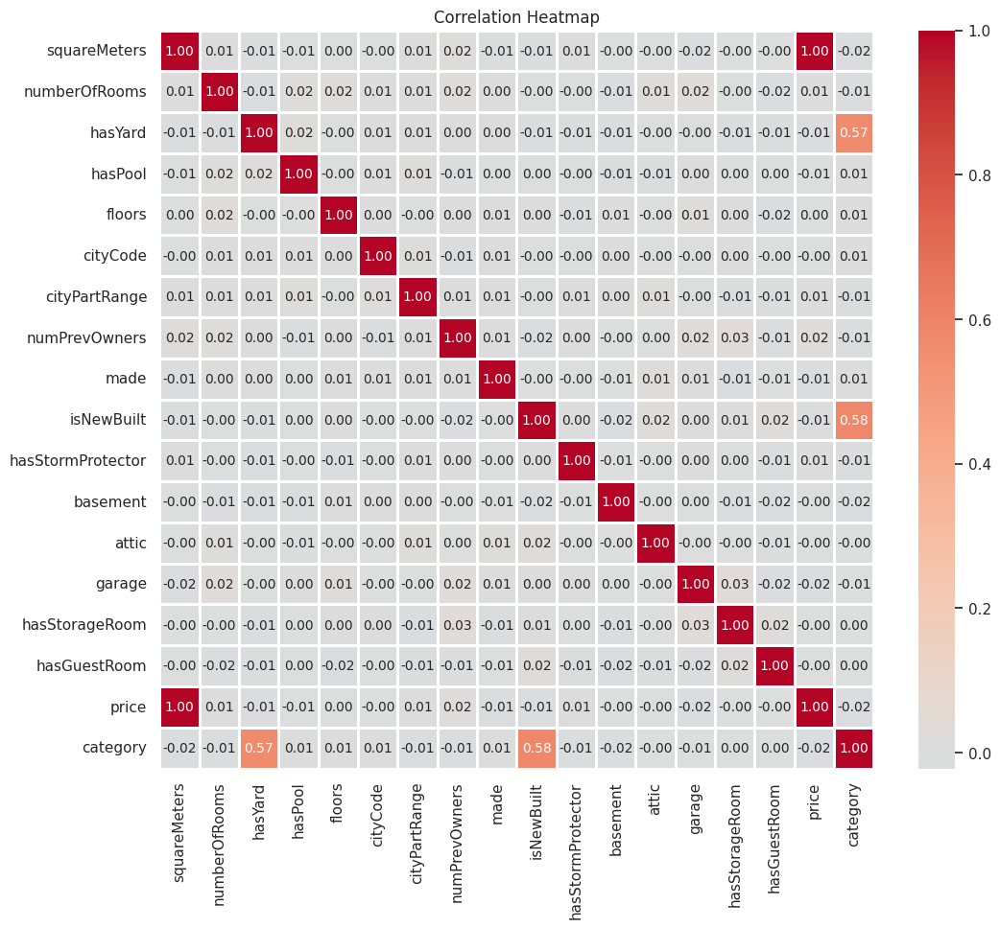

In [22]:
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.8, annot_kws={"size": 10}, center=0)
plt.title('Correlation Heatmap')
plt.show()

In [23]:
sorted_correlation_matrix = correlation_matrix['price'].abs().sort_values(ascending=False)
sorted_correlation_matrix

price                1.000000
squareMeters         0.999999
category             0.017663
garage               0.017229
numPrevOwners        0.016619
isNewBuilt           0.010643
numberOfRooms        0.009591
cityPartRange        0.008813
hasStormProtector    0.007496
made                 0.007210
hasYard              0.006119
hasPool              0.005070
basement             0.003967
hasStorageRoom       0.003485
floors               0.001654
cityCode             0.001539
hasGuestRoom         0.000644
attic                0.000600
Name: price, dtype: float64

In [24]:
sorted_correlation_matrix[:5]

price            1.000000
squareMeters     0.999999
category         0.017663
garage           0.017229
numPrevOwners    0.016619
Name: price, dtype: float64

In [25]:
sorted_correlation_columns = sorted_correlation_matrix.index[:5].to_list()
sorted_correlation_columns

['price', 'squareMeters', 'category', 'garage', 'numPrevOwners']

In [26]:
new_df = df[sorted_correlation_columns]
new_df

price,squareMeters,category,garage,numPrevOwners
7.55908e+06,75523,0,956,8
8.08599e+06,80771,1,128,6
5.57464e+06,55712,0,135,8
3.23256e+06,32316,1,359,4
7.05505e+06,70429,1,292,7
3.92665e+06,39223,0,757,6
5.87638e+06,58682,1,848,9
8.69687e+06,86929,1,654,4
5.15406e+06,51522,0,807,3
3.97089e+06,39686,0,591,8


In [27]:
new_X = new_df.columns
new_X.remove(y)
new_X, y

(['squareMeters', 'category', 'garage', 'numPrevOwners'], 'price')

In [28]:
df_train, df_test = new_df.split_frame([0.75])

In [29]:
df_train.shape, df_test.shape

((7460, 5), (2540, 5))

In [30]:
aml = H2OAutoML(max_runtime_secs=max_run_time, seed=1)

In [31]:
aml.train(x=new_X,y=y,training_frame=df_train)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),6/12
# GBM base models (used / total),3/5
# XGBoost base models (used / total),2/3
# DeepLearning base models (used / total),1/1
# DRF base models (used / total),0/2
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


In [32]:
print(aml.leaderboard)

model_id                                                    rmse          mse      mae    rmsle    mean_residual_deviance
StackedEnsemble_AllModels_2_AutoML_2_20240219_194916     25732    6.62136e+08  18891.2      nan               6.62136e+08
StackedEnsemble_BestOfFamily_3_AutoML_2_20240219_194916  25760.9  6.63626e+08  18910.3      nan               6.63626e+08
StackedEnsemble_AllModels_1_AutoML_2_20240219_194916     26849.3  7.20883e+08  18661.8      nan               7.20883e+08
StackedEnsemble_BestOfFamily_2_AutoML_2_20240219_194916  27113    7.35115e+08  18825.8      nan               7.35115e+08
DeepLearning_1_AutoML_2_20240219_194916                  30149.5  9.0899e+08   21332.4      nan               9.0899e+08
GBM_2_AutoML_2_20240219_194916                           30768    9.46667e+08  21136.6      nan               9.46667e+08
XGBoost_2_AutoML_2_20240219_194916                       35911.3  1.28962e+09  23434.8      nan               1.28962e+09
GBM_4_AutoML_2_20240219_1

# **Pair Plot**

Plotting Pair Plot to analyze linearity amongst dependant and independant variables

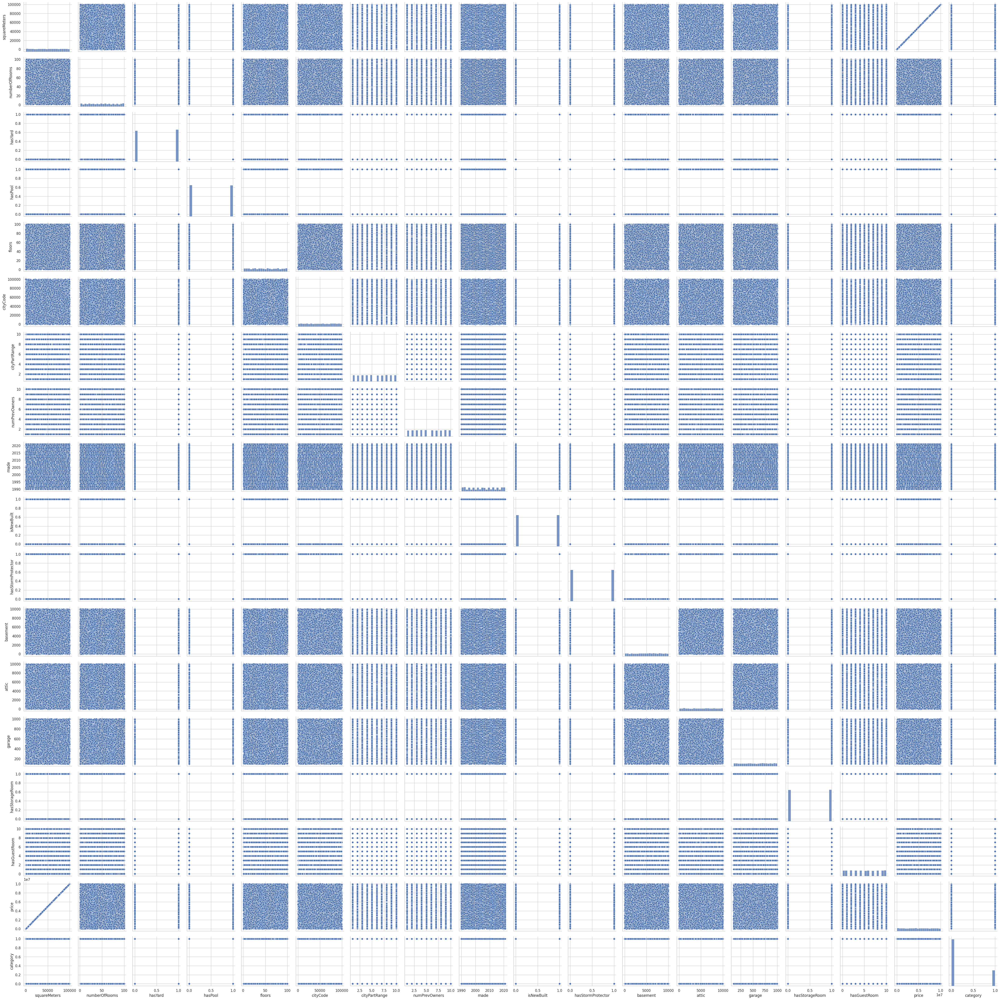

In [33]:
sns.pairplot(dff)

In [34]:
model_index=0
glm_index=0
glm_model=''
aml1_leaderboard_df1=aml.leaderboard.as_data_frame()
models_dict={}
for m in aml1_leaderboard_df1['model_id']:
  models_dict[m]=model_index
  if 'StackedEnsemble' not in m:
    break
  model_index=model_index+1

for m in aml1_leaderboard_df1['model_id']:
  if 'GLM' in m:
    models_dict[m]=glm_index
    break
  glm_index=glm_index+1
models_dict

Export File progress: |██████████████████████████████████████████████████████████| (done) 100%


{'StackedEnsemble_AllModels_2_AutoML_2_20240219_194916': 0,
 'StackedEnsemble_BestOfFamily_3_AutoML_2_20240219_194916': 1,
 'StackedEnsemble_AllModels_1_AutoML_2_20240219_194916': 2,
 'StackedEnsemble_BestOfFamily_2_AutoML_2_20240219_194916': 3,
 'DeepLearning_1_AutoML_2_20240219_194916': 4,
 'GLM_1_AutoML_2_20240219_194916': 18}

In [35]:
best_model = h2o.get_model(aml.leaderboard[model_index,'model_id'])
best_model

Model Details
=============
H2ODeepLearningEstimator : Deep Learning
Model Key: DeepLearning_1_AutoML_2_20240219_194916


Status of Neuron Layers: predicting price, regression, gaussian distribution, Quadratic loss, 281 weights/biases, 7.9 KB, 53,680 training samples, mini-batch size 1
    layer    units    type       dropout    l1    l2    mean_rate            rate_rms              momentum    mean_weight           weight_rms          mean_bias             bias_rms
--  -------  -------  ---------  ---------  ----  ----  -------------------  --------------------  ----------  --------------------  ------------------  --------------------  -----------------------
    1        4        Input      0.0
    2        10       Rectifier  0.0        0.0   0.0   0.04780904401559383  0.03248174488544464   0.0         0.03883745369967073   0.3338097333908081  0.520666157417363     0.19533538818359375
    3        10       Rectifier  0.0        0.0   0.0   0.05388549189083278  0.022329404950141907  0.0         0.01698770059272647   0.3510754108428955  1.007088143727096     0.12844449281692505
    4        10       Rectifier  0.0        0.0   0.0   0.14646733312227297  0.28634965419769287   0.0         -0.0727118119224906   0.2869749069213867  0.995194103812603     0.027742795646190643
    5        1        Linear                0.0   0.0   0.11681732445722445  0.2932702302932739    0.0         0.033685389906167984  0.3596048355102539  -0.05697306518682201  1.0971281125650402e-154

ModelMetricsRegression: deeplearning
** Reported on train data. **

MSE: 1175336490.0501244
RMSE: 34283.18086248889
MAE: 24157.06473005939
RMSLE: NaN
Mean Residual Deviance: 1175336490.0501244

ModelMetricsRegression: deeplearning
** Reported on cross-validation data. **

MSE: 908990419.5294316
RMSE: 30149.467980868776
MAE: 21332.41634535418
RMSLE: NaN
Mean Residual Deviance: 908990419.5294316

Cross-Validation Metrics Summary: 
                        mean         sd           cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  -----------  -----------  ------------  ------------  ------------  ------------  ------------
mae                     100175       115021       221795        230333        10311.4       18114.8       20318
mean_residual_deviance  3.55557e+10  4.82413e+10  8.19364e+10   9.44224e+10   2.46281e+08   5.73796e+08   5.99489e+08
mse                     3.55557e+10  4.82413e+10  8.19364e+10   9.44224e+10   2.46281e+08   5.73796e+08   5.99489e+08
r2                      0.99567      0.00587151   0.989958      0.988564      0.999969      0.999931      0.999929
residual_deviance       3.55557e+10  4.82413e+10  8.19364e+10   9.44224e+10   2.46281e+08   5.73796e+08   5.99489e+08
rmse                    131532       151059       286245        307282        15693.4       23954         24484.5
rmsle                   0.118394     0.12116      0.299355      nan           0.047397      0.0532716     0.0735503

Scoring History: 
    timestamp            duration    training_speed    epochs    iterations    samples    training_rmse    training_deviance    training_mae    training_r2
--  -------------------  ----------  ----------------  --------  ------------  ---------  ---------------  -------------------  --------------  -------------
    2024-02-19 19:52:27  0.000 sec                     0         0             0          nan              nan                  nan             nan
    2024-02-19 19:52:27  2.634 sec   172285 obs/sec    0.646649  1             4824       342311           1.17177e+11          275714          0.985781
    2024-02-19 19:52:27  2.933 sec   172051 obs/sec    7.19571   11            53680      34283.2          1.17534e+09          24157.1         0.999857

Variable Importances: 
variable       relative_importance    scaled_importance    percentage
-------------  ---------------------  -------------------  ------------
category       1                      1                    0.354694
square

In [109]:
aml.varimp()

,DeepLearning_2,DeepLearning_1,GBM_grid_1_model_1,GLM_2,XGBoost_5,GBM_grid_2_model_1,XGBoost_grid_1_model_1,XRT_1,GBM_4,GBM_grid_2_model_2,...,GBM_7,GBM_9,GBM_10,GBM_6,DRF_1,GLM_1,XGBoost_grid_2_model_1,DRF_2,XRT_2,GBM_8
squareMeters,0.400223,0.345718,0.904202,0.869001,0.882943,0.831197,0.985218,0.994996,0.995352,0.999672,...,0.986648,0.993455,0.989455,0.991424,0.978285,0.956408,0.949450,0.947757,0.961534,0.956664
numPrevOwners,0.030016,0.138234,0.000868,0.022335,0.008170,0.008831,0.002055,0.001236,0.001036,0.000000,...,0.000869,0.000415,0.000285,0.000466,0.004358,0.017133,0.003172,0.003212,0.002574,0.001682
garage,0.022938,0.161354,0.094673,0.013046,0.009861,0.014333,0.012527,0.003609,0.003345,0.000000,...,0.001801,0.000862,0.000768,0.000556,0.016879,0.012571,0.001213,0.005583,0.004244,0.005150
category,0.075736,0.354694,0.000257,0.015600,0.001361,0.002343,0.000200,0.000159,0.000267,0.000000,...,0.000039,0.000038,0.000060,0.000085,0.000478,0.013888,0.000073,0.000547,0.000349,0.000026


In [36]:
best_model.algo

'deeplearning'

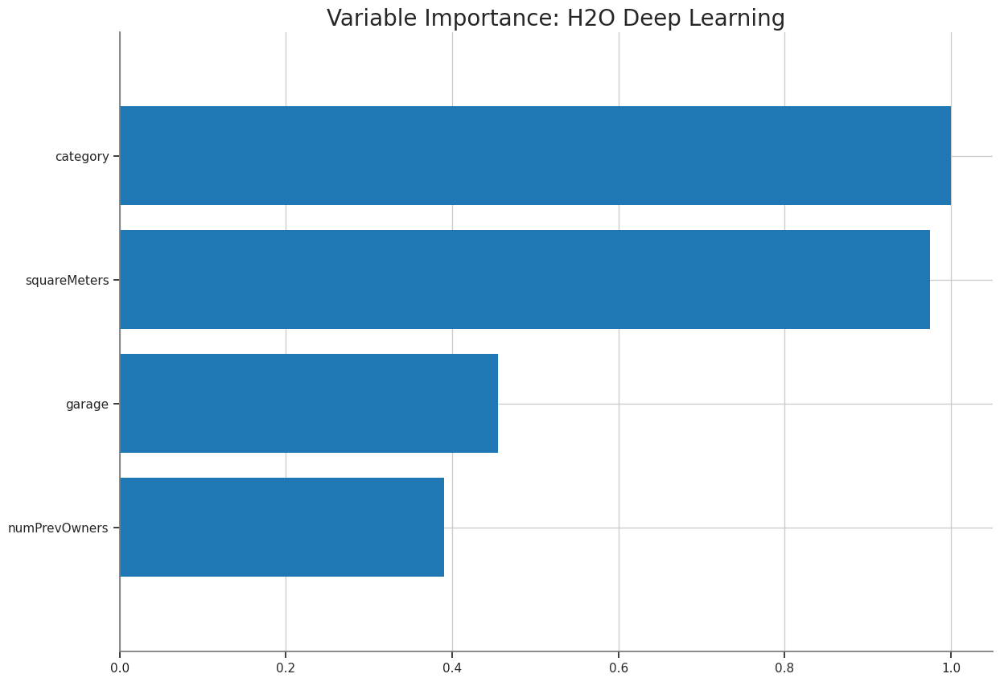

<Figure size 640x480 with 0 Axes>

In [37]:
best_model.varimp_plot()

<>:1: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:1: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<ipython-input-38-df64e0e8617c>:1: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if glm_index is not 0:


18
glm


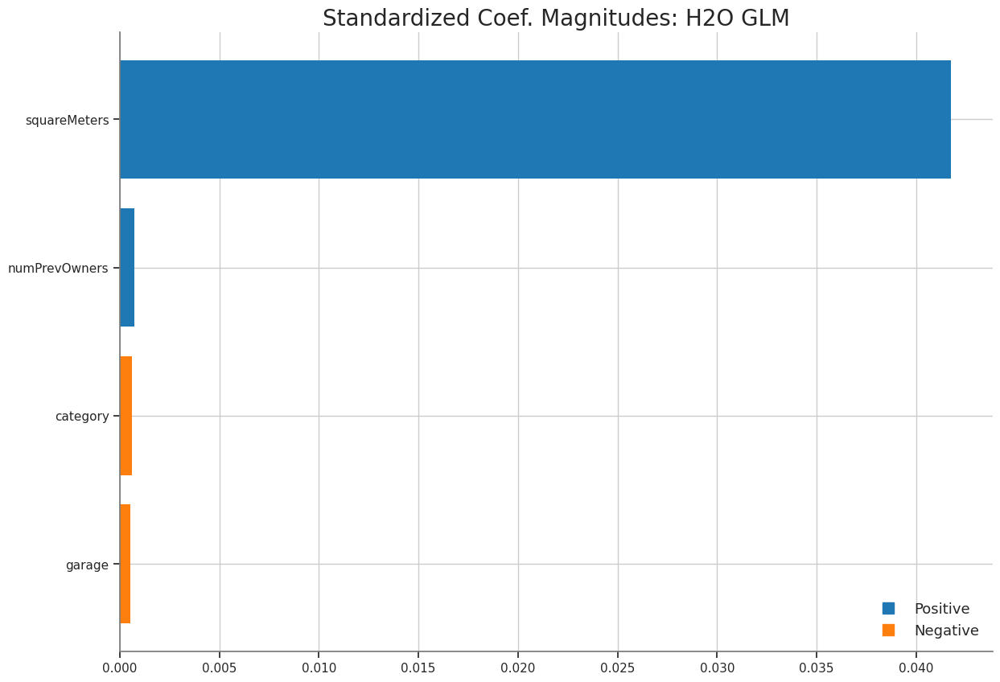

In [38]:
if glm_index is not 0:
  print(glm_index)
  glm_model=h2o.get_model(aml.leaderboard[glm_index,'model_id'])
  print(glm_model.algo)
  glm_model.std_coef_plot()

In [71]:
X_train, X_test, y_train, y_test = tts(dff[sorted_correlation_columns], dff[y], test_size=0.2,random_state=42)

In [72]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((8000, 5), (2000, 5), (8000,), (2000,))

In [73]:
constant_term = sm.add_constant(X_train[sorted_correlation_columns].values)
model1 = sm.OLS(y_train, constant_term).fit()

In [74]:
y_pred = model1.predict(sm.add_constant(X_train[sorted_correlation_columns]))

# **Calculating the Residuals**

In [76]:
residuals = y_train - y_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))
mse_dict['initial_mse'] = mean_squared_error(y_train, y_pred)
mean_residuals, mse_dict['initial_mse']

Mean of Residuals 2.8079382673240615e-08


(2.8079382673240615e-08, 1.0410189592887331e-15)

# **Checking Normality of Residuals**

<ipython-input-90-399e0398f458>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  p = sns.distplot(residuals,kde=True)


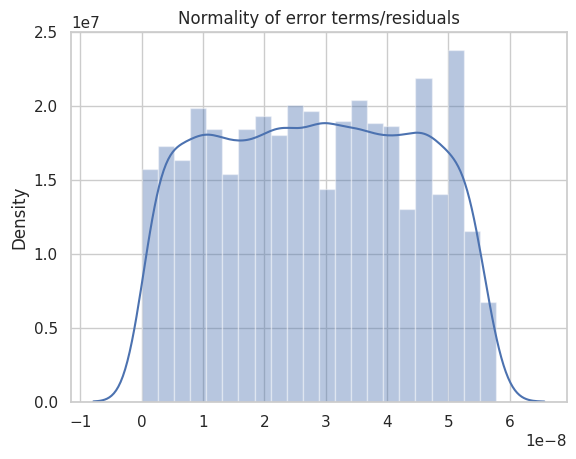

In [90]:
p = sns.distplot(residuals,kde=True)
p = plt.title('Normality of error terms/residuals')

# **Checking homoscedasticity (constant variance of residuals)**

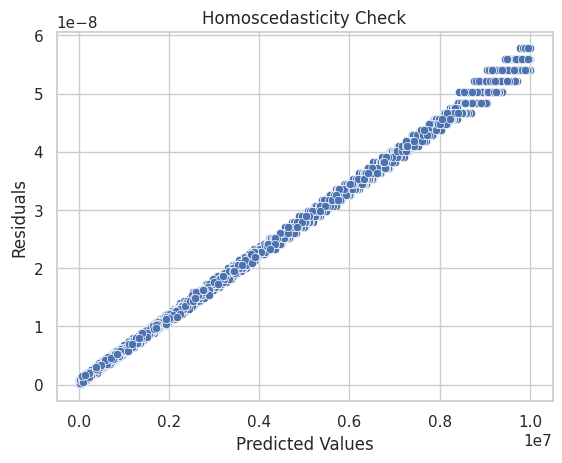

In [91]:
p = sns.scatterplot(x=y_pred, y=residuals)
p = plt.xlabel('Predicted Values')
p = plt.ylabel('Residuals')
p = plt.title('Homoscedasticity Check')
plt.show()

# **Durbin-Watson test for autocorrelation**

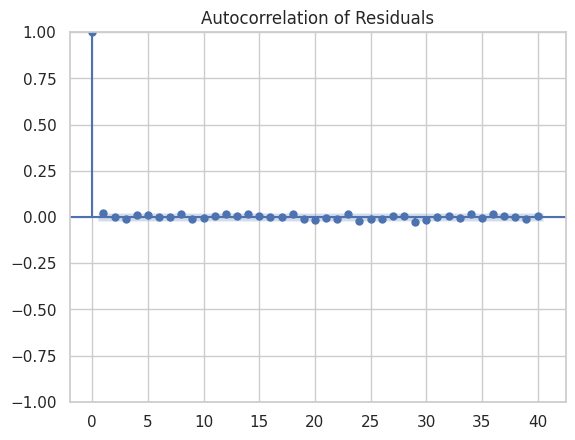

Durbin-Watson Statistic: 0.4754450622612425


In [93]:
autocorrelation = sm.graphics.tsa.plot_acf(residuals)
plt.title('Autocorrelation of Residuals')
plt.show()

durbin_watson_statistic = durbin_watson(residuals)
print(f'Durbin-Watson Statistic: {durbin_watson_statistic}')

**Durbin-Watson statistic of 0.475 indicates a strong positive autocorrelation in the residuals. Positive autocorrelation means that if the residual at one observation is higher than expected, the residual at the next observation is also likely to be higher than expected, and vice versa.**

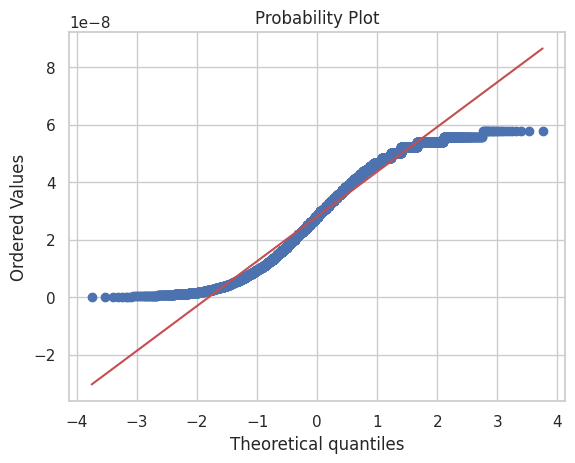

In [51]:
stats.probplot(residuals, dist="norm", plot=pylab)
pylab.show()

<Axes: xlabel='price', ylabel='Count'>

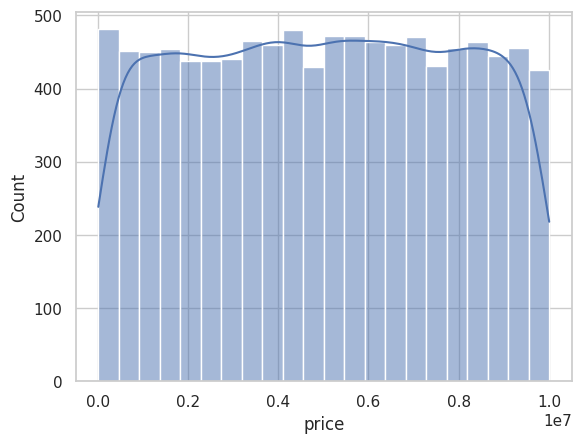

In [54]:
sns.histplot(dff.price, kde = True)

# **Ridge Regularization**

In [61]:
ridge_model = H2OGeneralizedLinearEstimator(
    family='gaussian',
    link='identity',
    alpha=0.5,  # The alpha parameter controls the strength of regularization (0 is none, 1 is strong)
    lambda_=1e-3  # The lambda parameter controls the magnitude of the regularization penalty
)

_model = H2OGeneralizedLinearEstimator(
    family='gaussian',
    compute_p_values=True,
    lambda_=0
)

In [62]:
ridge_model.train(x=sorted_correlation_columns, y=y, training_frame=h2o.H2OFrame(X_train))
print(ridge_model)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
Model Details
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1708371920172_41


GLM Model: summary
    family    link      regularization                              number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ------------------------------------------  ----------------------------  -----------------------------  ----------------------  ------------------------------------------------------
    gaussian  identity  Elastic Net (alpha = 0.5, lambda = 0.001 )  4                             4                              1                       Key_Frame__upload_91423b9eeb34fb895e0d14d4b59745a3.hex

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 11873695.52481495


In [63]:
predictions = ridge_model.predict(h2o.H2OFrame(X_train))
print(predictions)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
glm prediction progress: |███████████████████████████████████████████████████████| (done) 100%
         predict
     8.15737e+06
     7.87755e+06
     7.80695e+06
     1.58034e+06
327229
     2.86746e+06
     9.68502e+06
     2.08689e+06
     8.2458e+06
     3.47346e+06
[8000 rows x 1 column]



In [64]:
_model.train(x=sorted_correlation_columns, y=y, training_frame=h2o.H2OFrame(X_train))
print(_model)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
Model Details
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1708371920172_42


GLM Model: summary
    family    link      regularization    number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ----------------  ----------------------------  -----------------------------  ----------------------  ------------------------------------------------------
    gaussian  identity  None              4                             4                              1                       Key_Frame__upload_a49567ca7eb62ff07be37c3305a8400b.hex

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 9835246.794845099
RMSE: 3136.1197035261744
MAE: 2539.866689070623
RMSLE: 0.009593921249674415
Me

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_1_AutoML_2_20240219_194916,18454.6,3.40573e+08,13511.1,0.0515851,3.40573e+08,2531,0.49355,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_2_20240219_194916,18561.3,3.4452e+08,13574.8,0.0501864,3.4452e+08,586,0.090074,StackedEnsemble
GBM_2_AutoML_2_20240219_194916,20110.2,4.04421e+08,14717.8,0.0468869,4.04421e+08,2510,0.087924,GBM
XGBoost_1_AutoML_2_20240219_194916,21137.5,4.46792e+08,12439.7,0.0338994,4.46792e+08,6578,0.035485,XGBoost
GBM_4_AutoML_2_20240219_194916,24089.3,5.80296e+08,16715,nan,5.80296e+08,2356,0.185529,GBM
GBM_3_AutoML_2_20240219_194916,27734.6,7.69207e+08,19253.1,nan,7.69207e+08,2586,0.144658,GBM
StackedEnsemble_AllModels_2_AutoML_2_20240219_194916,29386.4,8.63561e+08,21455.4,nan,8.63561e+08,4912,0.953032,StackedEnsemble
StackedEnsemble_BestOfFamily_3_AutoML_2_20240219_194916,29401.2,8.64433e+08,21469.3,nan,8.64433e+08,623,0.074587,StackedEnsemble
StackedEnsemble_BestOfFamily_1_AutoML_2_20240219_194916,32069,1.02842e+09,23960.4,nan,1.02842e+09,2017,0.280811,StackedEnsemble
XGBoost_2_AutoML_2_20240219_194916,32903.6,1.08265e+09,23456.8,nan,1.08265e+09,2442,0.011129,XGBoost


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

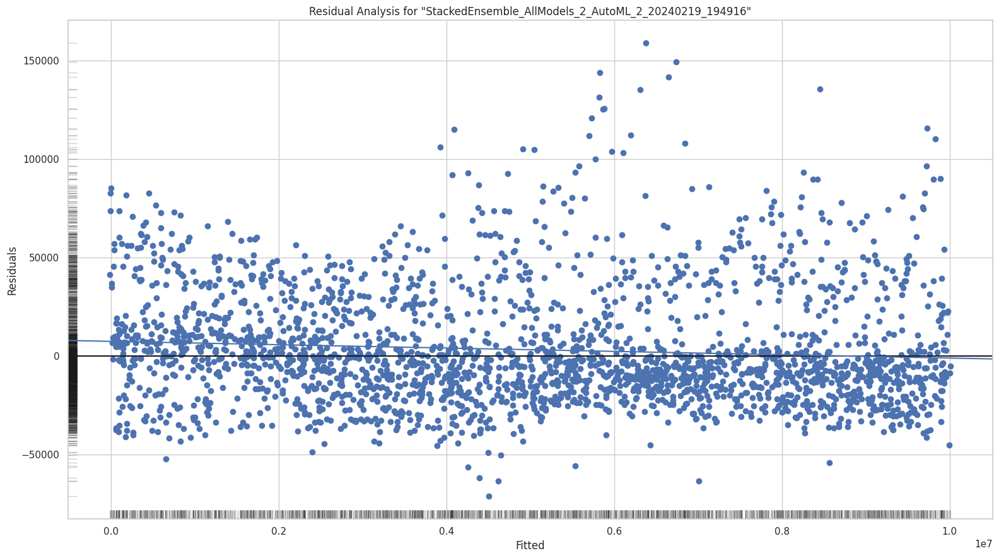

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

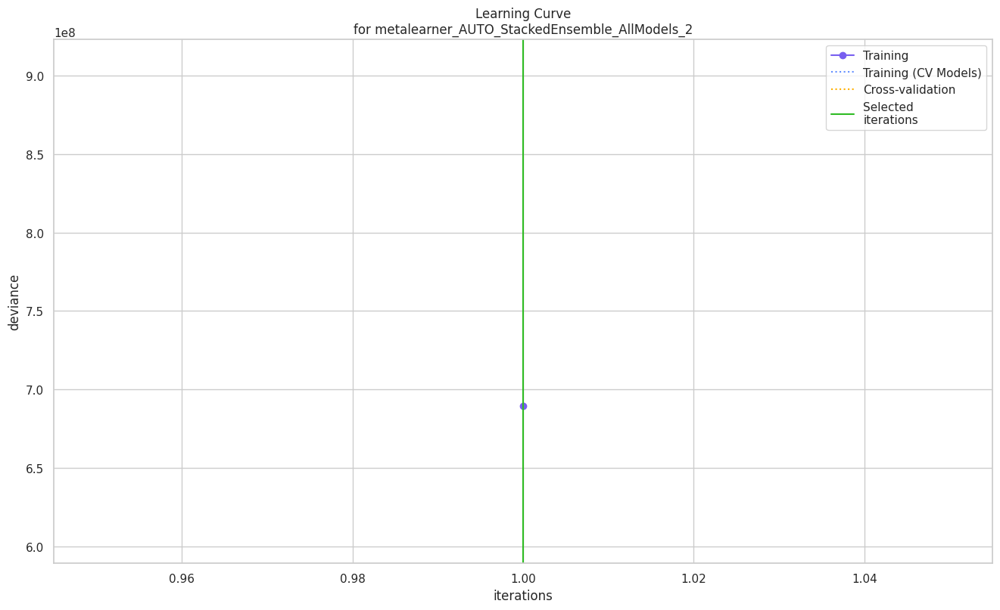

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

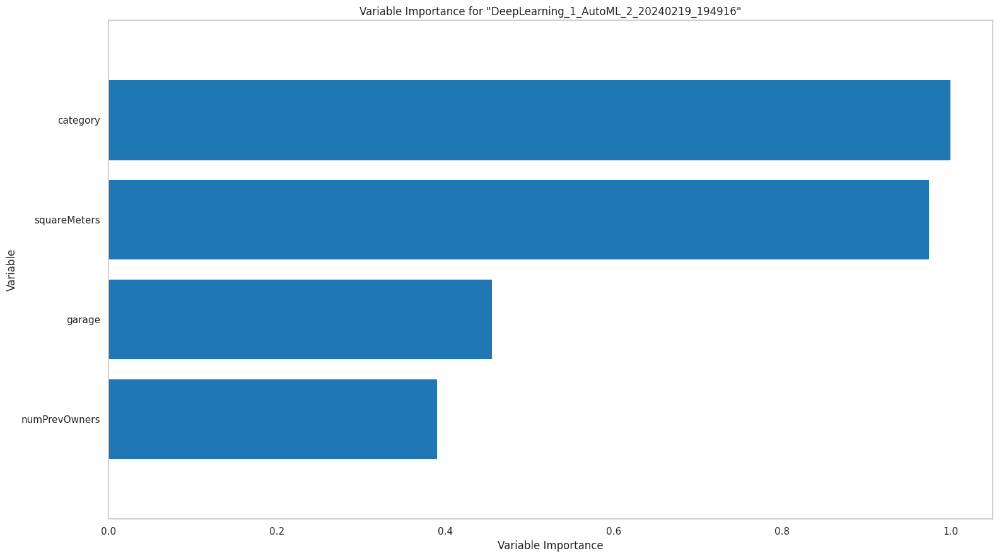

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

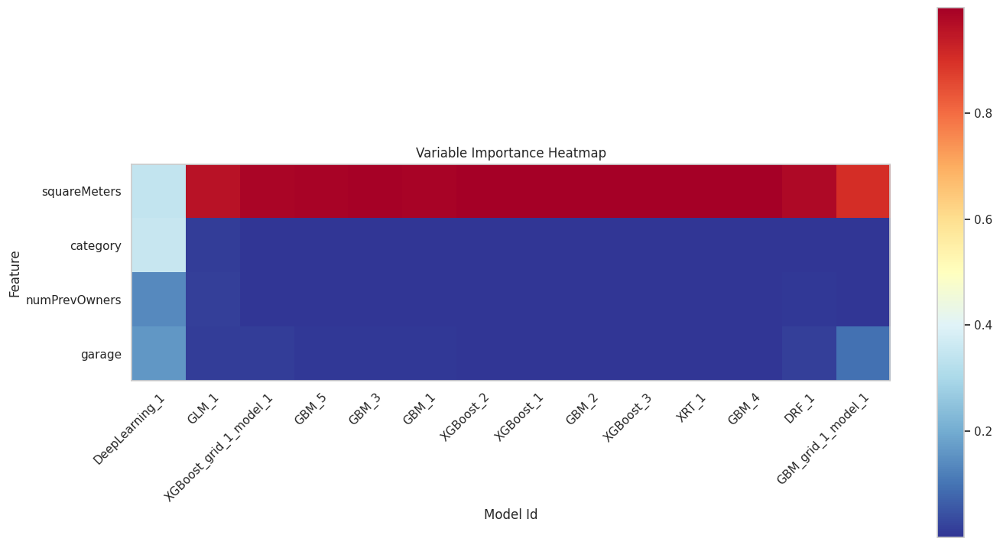

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

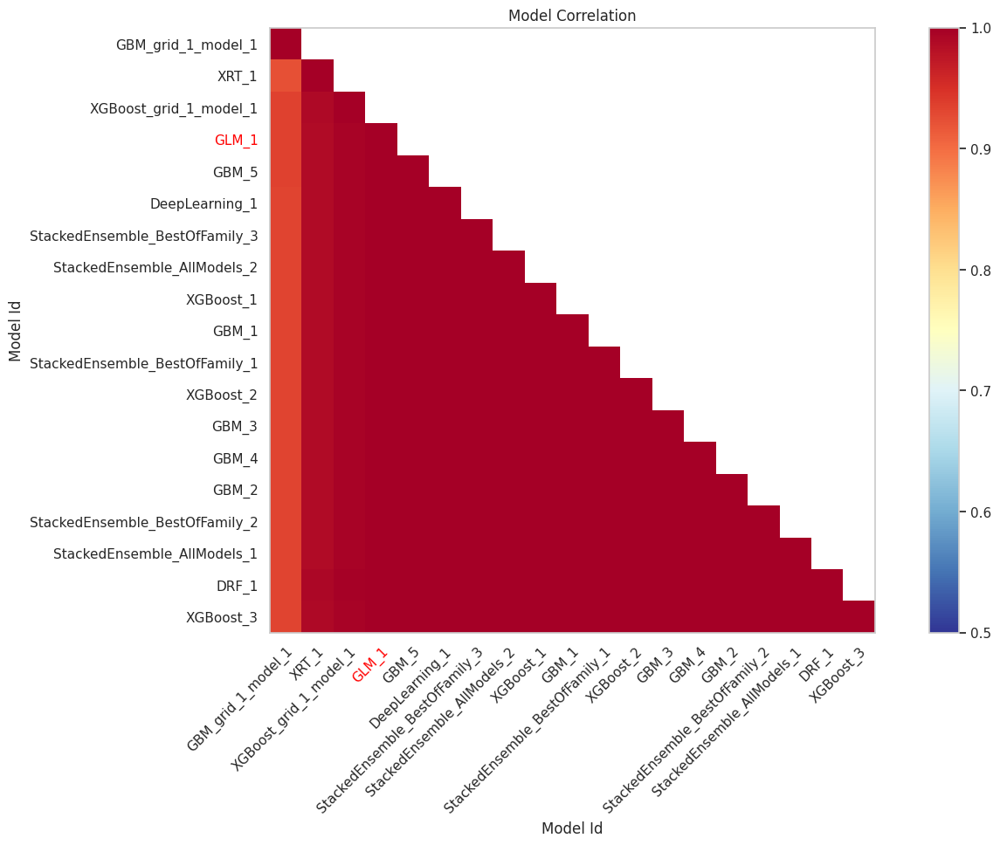

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

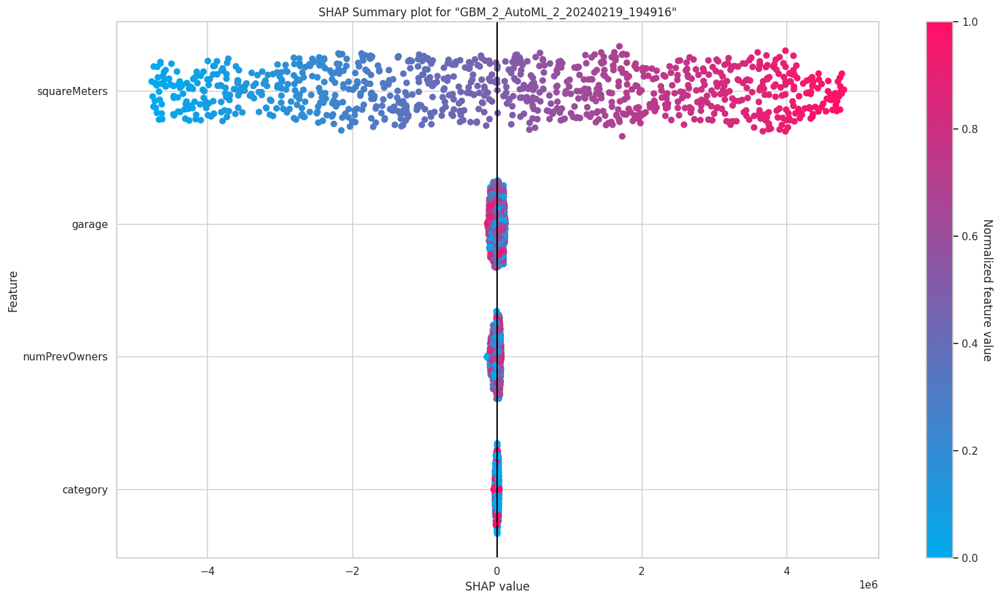

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

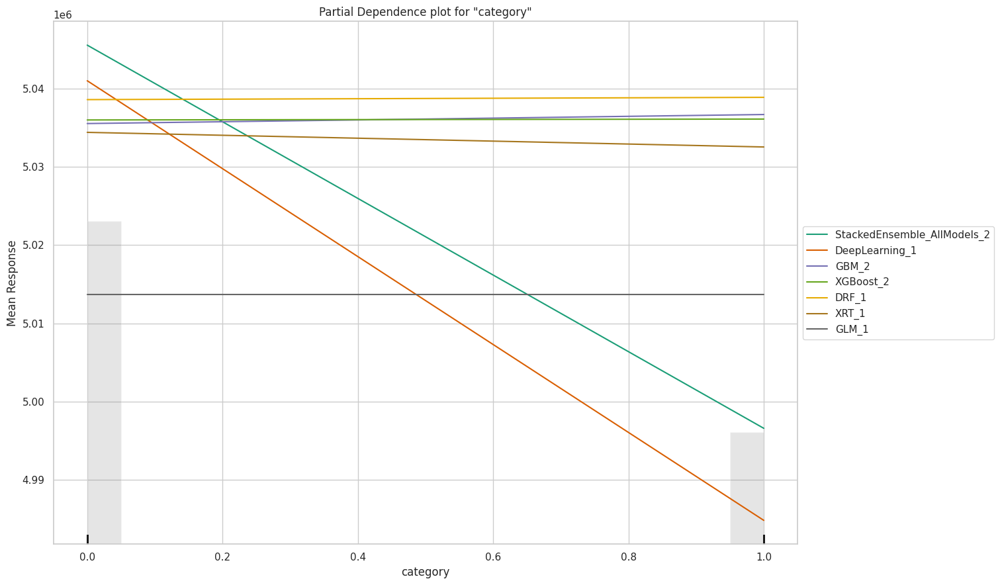

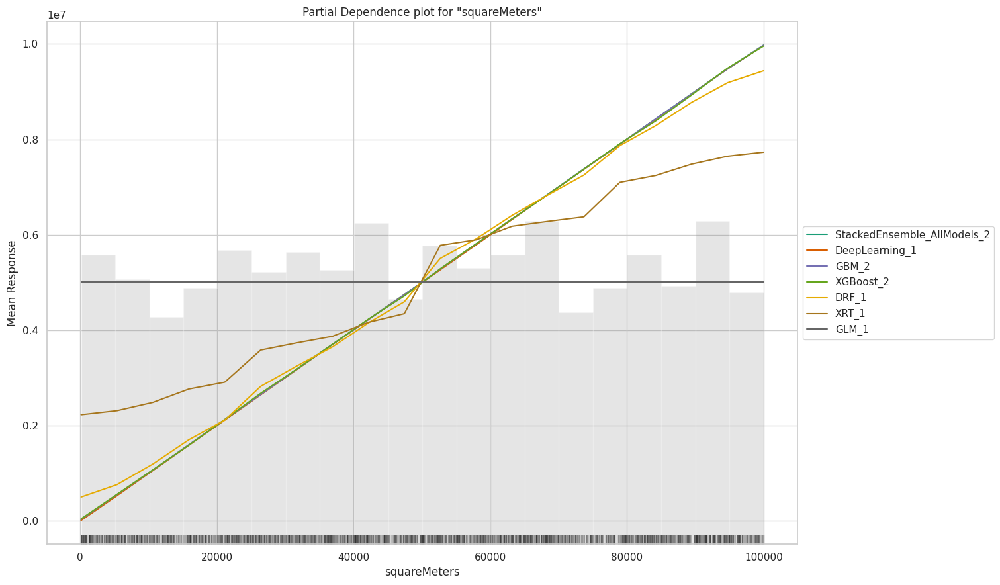

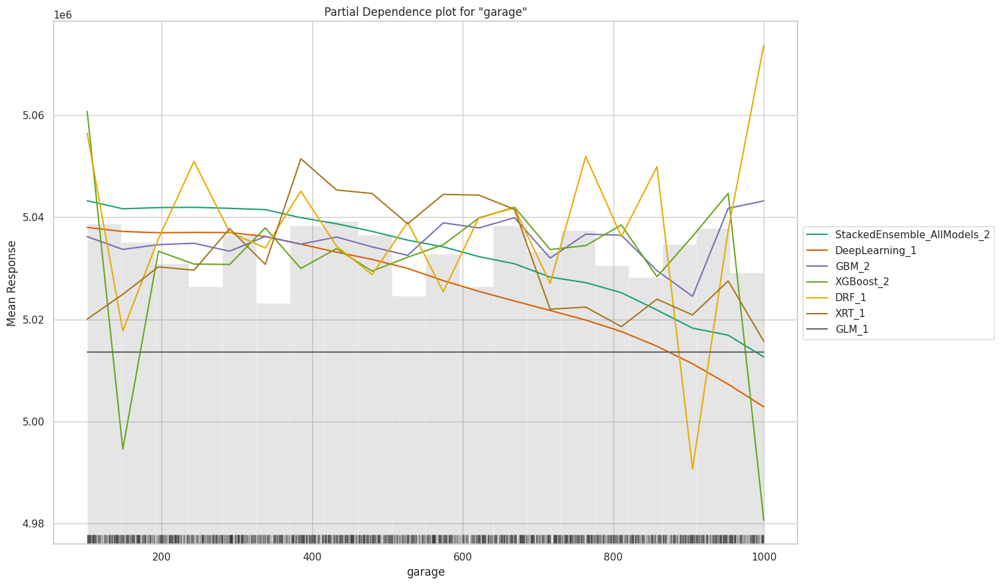

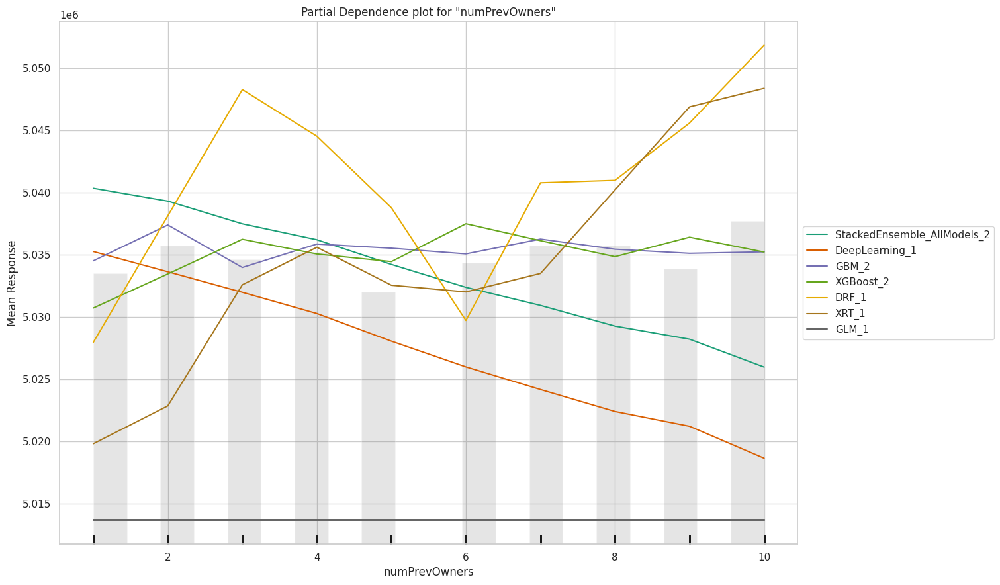

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

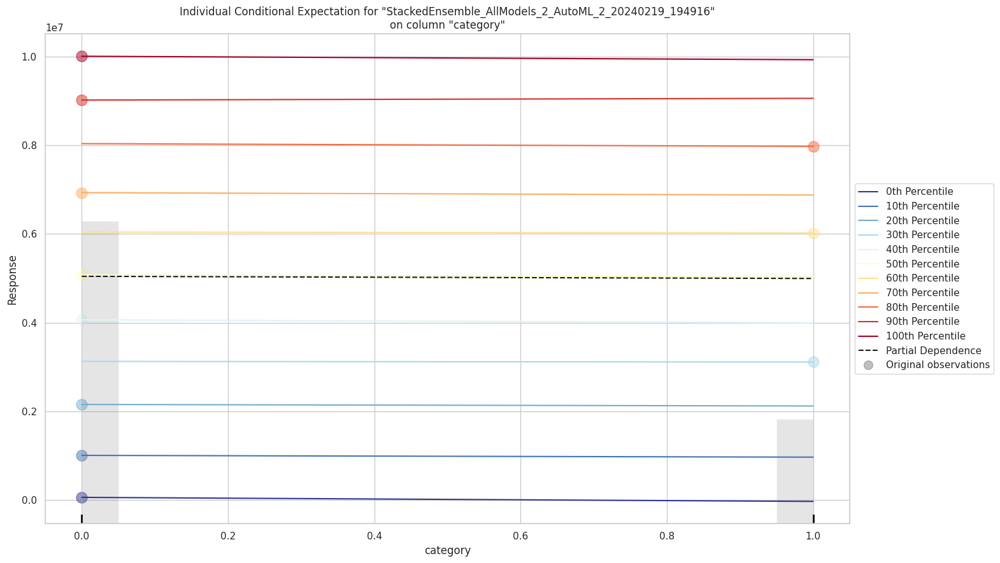

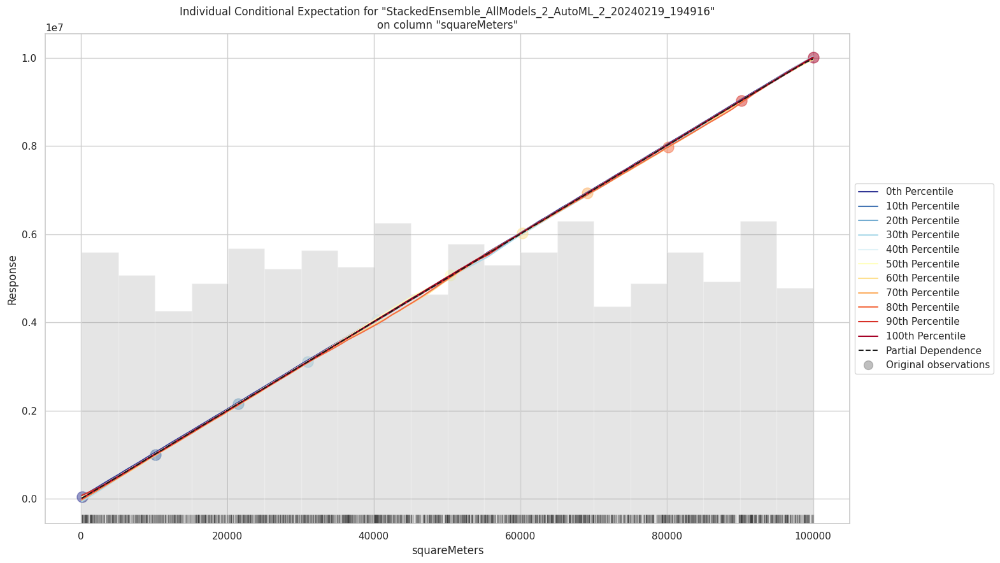

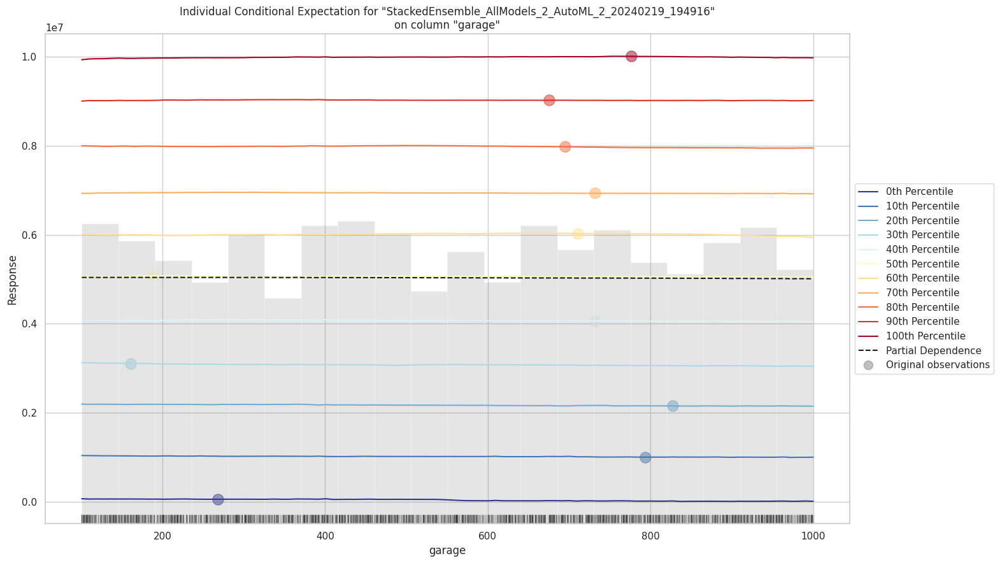

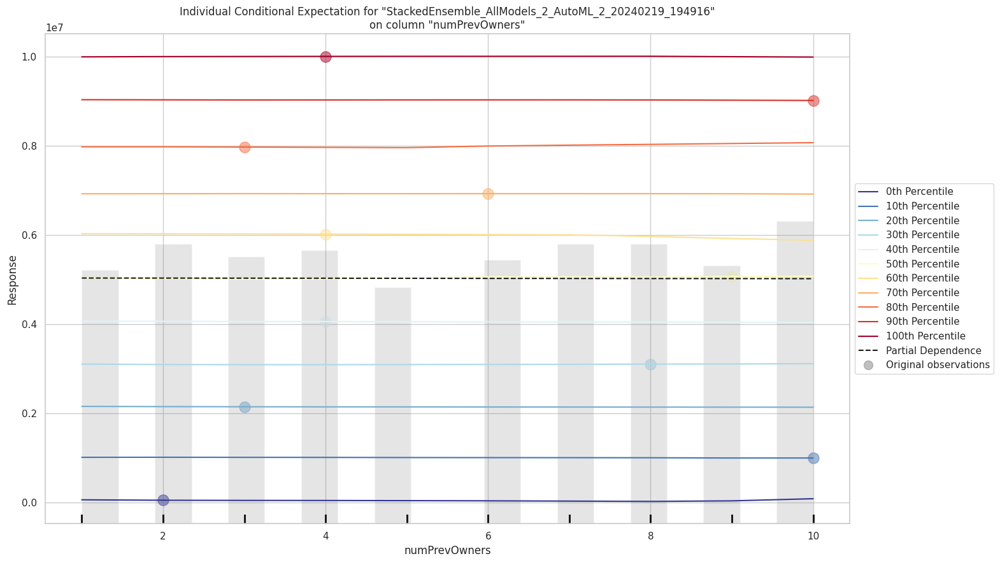

In [65]:
explain = aml.explain(test_df)

In [78]:
X_train, X_val, y_train, y_val = tts(X_train, y_train, test_size=0.2, random_state=42)

rf_model = RandomForestRegressor()

param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)

# Fitting the GridSearchCV to the data
grid_search.fit(X_train, y_train)

# Printing the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

# Getting the best model
best_model = grid_search.best_estimator_

# Evaluating the best model on the validation set
y_val_pred = best_model.predict(X_val)
mse_dict['hpt_model'] = mean_squared_error(y_val, y_val_pred)

print("Validation MSE for Best Model:", mse_dict['hpt_model'])

Best Hyperparameters: {'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
Validation MSE for Best Model: 2285204.016850321


In [79]:
mse_dict

{'initial_mse': 1.0410189592887331e-15, 'hpt_model': 2285204.016850321}

# **Conclusion**

A fundamental algorithm based on the linear regression method to predict Paris Housing Prices was constructed. VIF, p-values and other tests were considered to ignore some of the independent variables. H20.ai framework was used to train and test the variables of the dataset. This gave the best model as ‘deeplearning’ and accuracy for test data was 99.9%. From the results shown it can be concluded that the proposed linear regression model can effectively analyze and predict the housing price with good accuracy.

# **Assignment Question/Answers**

#  1) Is the relationship significant?

The significance of the relationship is typically assessed by looking at the p-values associated with each variable in the regression analysis. In this case, the p-values are found under the column labeled "P>|t|". If the p-value is less than the commonly used threshold of 0.05, it is often considered statistically significant.

Variables with p-values less than 0.05 (such as squareMeters, hasYard, hasPool, floors, cityPartRange, isNewBuilt, and hasStormProtector) are considered statistically significant, suggesting a significant relationship with the dependent variable (price). The other variables do not show a significant relationship based on the conventional 0.05 significance level.

# 2) Are any model assumptions violated?

Linear relationship- The graph for dependent and independent variable needs to be linear by keeping other variables constant. When target variable is plotted against all other independent variables, linear relation is observed for few of them. Hence this assumption is not violated.


Homoscedasticity which means normality of the error distribution - The plot for residuals should be normally distributed i.e., it should form a bell-curve shape. For this model homoscedasticity appears to be satisfied based on the linear pattern observed.


No or little multicollinearity - The VIF values for most variables are around 4, suggesting moderate multicollinearity. However, the variable 'made' has a very high VIF of 38.814462, indicating a potential issue with multicollinearity for that specific variable.


Durbin-Watson Statistic: The Durbin-Watson statistic is 0.475, indicating a strong positive autocorrelation in the residuals. This violates the assumption of independence of residuals.

# 3) Is there any multicollinearity in the model?

Yes, there is evidence of multicollinearity in the model based on the Variance Inflation Factor (VIF) values provided earlier. VIF measures the extent to which the variance of an estimated regression coefficient increases when your predictors are correlated. Generally, VIF values above 5 or 10 are considered indicative of high multicollinearity.

Here several variables have VIF values around 4, indicating moderate multicollinearity. However, the variable 'made' stands out with a very high VIF of 38.814462, suggesting a high multicollinearity for that specific variable. Hence the variable is dropped from being a predictor variable.

# 4) Is the multivariate models are predictor variables independent of all the other predictor variables?

The correlation matrix provides information about the correlation (linear relationship) between pairs of variables.

From the correlation_matrix, the following things can be observed,


*   **Weak Linear Relationships:** Most of the correlations between predictor variables appear to be weak, with correlation coefficients close to zero.
*   **Moderate Correlations:** Some pairs of variables have slightly stronger correlations (e.g., 'hasYard' and 'isNewBuilt' with a correlation of 0.567788).
*   **High Correlations:** 'price' and 'squareMeters' have strong correlation of 1.000000, which means they are correlated to each other.



# 5) In multivariate models, rank the most significant predictor variables and exclude insignificant ones from the model.

From the variable importance plot, it is evident that the higher the importance score, the more influential the predictor is in making predictions.

In our case, it appears that the squareMeters, numPrevOwners, garage, and category variables are among the most significant predictors across different models.

Here's a general ranking based on the highest importance scores:

1. `squareMeters`
2. `numPrevOwners`
3. `garage`
4. `category`

These variables have relatively higher importance scores across various models. And the insignificant varibles are removed before passing into training.

# 6) Does the model make sense?

For a model to make sense it should follow all the assumptions and have p value, VIF between their respective ranges. RMSE should be as low as possible considering the minimum and maximum values of the target variable. Other than that, R2 too is 0.999 which is considered good in terms of accuracy. So overall the model makes sense.

# 7) Does regularization help?

 Regularization is a technique used for tuning the random noise function by adding an additional term to noise function. This additional term controls the excessively fluctuating function such that the coefficients don’t take extreme values and the prediction of target value for test data is not highly affected. The main use of Regularization is to minimize the validation loss and try to improve the accuracy of the model. For this model Ridge Regularization was used on training data.


 I've trained two models: a regular Linear Regression model (model) and a Ridge Regularization model (ridge_model) using H2O.

**Comparison:**

* Both models exhibit extremely low values for MSE, RMSE, and MAE, indicating excellent predictive performance.
* The R-squared values for both models are very close to 1, suggesting a high degree of explained variability in the target variable.


**Observations:**

* The Ridge Regularization model (ridge_model) generally has slightly higher values for MSE, RMSE, and MAE compared to the Linear Regression model (model).
* The differences, however, are relatively small, and both models perform exceptionally well.

Hence it can be concluded that for this model regularization does not have a significant impact.

# 8) Which independent variables are significant?

From the OLS regression results, the significance of independent variables is typically indicated by the p-values in the "P>|t|" column. A p-value less than a chosen significance level (commonly 0.05) suggests that the corresponding coefficient is statistically significant.

Therefore, the significant independent variables are:

* `squareMeters`
* `hasYard`
* `hasPool`
* `floors`
* `cityPartRange`
* `isNewBuilt`
* `hasStormProtector`

# 9) Which hyperparameters are important?

 To find best set a hyperparameter and combinations of interacting hyperparameters for a given dataset hyperparameters tuning is used.
Hyperparameter tuning involves systematically searching for the best combination of hyperparameters for a machine learning model. For this model tuning, I've used scikit-learn's **GridSearchCV** for hyperparameter tuning with a **RandomForestRegressor**.



The best hyperparameters for this model are:-


`{'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}`

# **References**

1. H20.ai- https://docs.h2o.ai/
2. OLS Model- http://net-informations.com/ds/mla/ols.html
3. Linear Regression- https://www.analyticsvidhya.com/blog/2021/05/all-you-need-to-know-about-your-first-machine-learning-model-linear-regression/
4. Linear Regression Assumptions- https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/assumptions-of-linear-regression/
5. Statsmodel Documentation - https://www.statsmodels.org/stable/index.html
6. Scikit-Learn Documentation - https://scikit-learn.org/stable/
7. SciPy Documentation - https://docs.scipy.org/doc/scipy/

# **LICENSE**

**MIT License**

Copyright (c) 2024 RMNaveen

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.

# **The End**